In [1]:
import sys
sys.path.append("../src/")

In [2]:
%load_ext autoreload
%autoreload 2

import pydevil

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# A quick tour on pydevil 

In this tutorial we will show the basic model of pydevil which performs a simple Negatibe Binomial regression on single cell data. For convenience we will use the classical PBMC dataset that is showed in the [scanpy tutorial](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)

In [3]:
import scanpy as sc
import patsy as ptsy
import torch
import numpy as np

As the filtered data comes with already normalized counts we will 

In [4]:
adata = sc.datasets.pbmc3k()
adata_proc = sc.datasets.pbmc3k_processed()

In [5]:
adata = adata[adata_proc.obs_names, :]
adata.obs = adata_proc.obs

In [6]:
library_size_factors = adata.obs["n_counts"] / adata.obs["n_counts"].mean()

In [7]:
library_size_factors

index
AAACATACAACCAC-1    1.020215
AAACATTGAGCTAC-1    2.067844
AAACATTGATCAGC-1    1.327249
AAACCGTGCTTCCG-1    1.113000
AAACCGTGTATGCG-1    0.413316
                      ...   
TTTCGAACTCTCAT-1    1.458836
TTTCTACTGAGGCA-1    1.452088
TTTCTACTTCCTCG-1    0.710228
TTTGCATGAGAGGC-1    0.431029
TTTGCATGCCTCAC-1    0.836753
Name: n_counts, Length: 2638, dtype: float32

In [8]:
adata

AnnData object with n_obs × n_vars = 2638 × 32738
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'gene_ids'

## Library size normalization

A simple application of this kind of linear model is library size normalization. For instance the popular normalization method [sctransform](https://github.com/satijalab/sctransform/) uses Pearson's residuals from a negative binomial linear regression against the number of counts per cell.

We include by default a term to correct for library size (that can be set to 1 if not used). We use a slightly different correction than other tools, where we 

In [9]:
normalization_model = ptsy.dmatrix("~ 1", adata.obs)

In [2]:
res_norm  = pydevil.run_SVDE(adata.X.todense(), # input data matrix 
                        normalization_model, # patsy design matrix 
                        library_size_factors, # library size factors
                        gene_names = adata.var_names, # gene names (coloumns in input matrix)
                        cell_names = adata.obs_names, # cell names (rows in input matrix)
                        optimizer_name = "Adam", 
                        lr = 0.01,
                        gamma_lr = 0.01,
                        steps = 500, 
                        full_cov = True, 
                        cuda = True)

NameError: name 'pydevil' is not defined

In [12]:
residuals = res_norm["residuals"]

In [13]:
adata_new = adata.copy()

In [14]:
adata_new.X = residuals 

In [15]:
sc.tl.pca(adata_new, svd_solver='arpack')
sc.pp.neighbors(adata_new, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata_new)

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/salvatore.milite/miniconda3/envs/scdee

/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


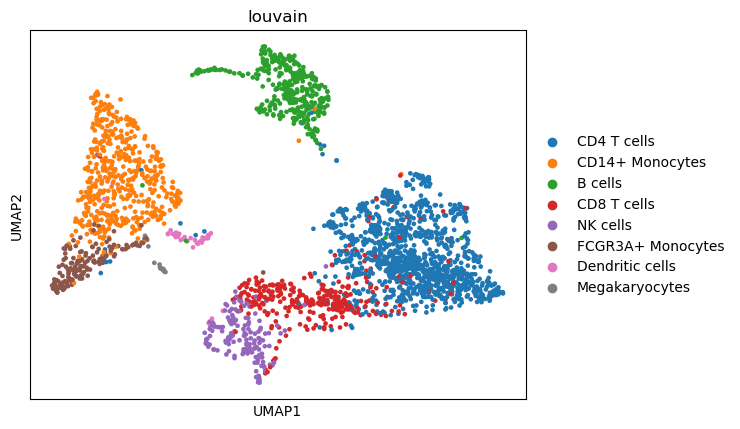

In [16]:
sc.pl.umap(adata_new, color=['louvain'])


In [17]:
covariates = ptsy.dmatrix("~ louvain - 1", adata.obs)

In [35]:
res_de  = pydevil.run_SVDE(adata.X.todense(), 
                        covariates, # new design matrix 
                        library_size_factors, 
                        gene_names = adata.var_names,
                        cell_names = adata.obs_names, 
                        lr = 0.05,
                        gamma_lr = 0.01,
                        steps = 500, 
                        full_cov = True, 
                        cuda = True)

cuda:0


ELBO: 20307099648.00000  :   0%|          | 2/500 [00:00<00:33, 14.67it/s]

tensor(1000000.1250, grad_fn=<MaxBackward1>)
tensor(0.0004, grad_fn=<MinBackward1>)
tensor(1050764.3750, grad_fn=<MaxBackward1>)
tensor(0.0004, grad_fn=<MinBackward1>)
tensor(1103398., grad_fn=<MaxBackward1>)
tensor(0.0004, grad_fn=<MinBackward1>)


ELBO: 16613736448.00000  :   1%|          | 6/500 [00:00<00:33, 14.96it/s]

tensor(1156933.6250, grad_fn=<MaxBackward1>)
tensor(0.0004, grad_fn=<MinBackward1>)
tensor(1211500.2500, grad_fn=<MaxBackward1>)
tensor(0.0005, grad_fn=<MinBackward1>)
tensor(1266122.7500, grad_fn=<MaxBackward1>)
tensor(0.0005, grad_fn=<MinBackward1>)
tensor(1321196.7500, grad_fn=<MaxBackward1>)
tensor(0.0005, grad_fn=<MinBackward1>)


ELBO: 13718701056.00000  :   2%|▏         | 10/500 [00:00<00:32, 15.06it/s]

tensor(1375851.6250, grad_fn=<MaxBackward1>)
tensor(0.0005, grad_fn=<MinBackward1>)
tensor(1431037.3750, grad_fn=<MaxBackward1>)
tensor(0.0006, grad_fn=<MinBackward1>)
tensor(1486062.2500, grad_fn=<MaxBackward1>)
tensor(0.0006, grad_fn=<MinBackward1>)
tensor(1539661.6250, grad_fn=<MaxBackward1>)
tensor(0.0006, grad_fn=<MinBackward1>)


ELBO: 11444468736.00000  :   3%|▎         | 14/500 [00:00<00:32, 15.09it/s]

tensor(1592465.7500, grad_fn=<MaxBackward1>)
tensor(0.0007, grad_fn=<MinBackward1>)
tensor(1643860.8750, grad_fn=<MaxBackward1>)
tensor(0.0007, grad_fn=<MinBackward1>)
tensor(1696736.6250, grad_fn=<MaxBackward1>)
tensor(0.0007, grad_fn=<MinBackward1>)
tensor(1746929.3750, grad_fn=<MaxBackward1>)
tensor(0.0007, grad_fn=<MinBackward1>)


ELBO: 9623772160.00000  :   4%|▎         | 18/500 [00:01<00:31, 15.10it/s] 

tensor(1793814.1250, grad_fn=<MaxBackward1>)
tensor(0.0008, grad_fn=<MinBackward1>)
tensor(1837318.3750, grad_fn=<MaxBackward1>)
tensor(0.0008, grad_fn=<MinBackward1>)
tensor(1879277.2500, grad_fn=<MaxBackward1>)
tensor(0.0008, grad_fn=<MinBackward1>)
tensor(1921294.3750, grad_fn=<MaxBackward1>)
tensor(0.0009, grad_fn=<MinBackward1>)


ELBO: 8170951680.00000  :   4%|▍         | 22/500 [00:01<00:31, 15.11it/s]

tensor(1959480., grad_fn=<MaxBackward1>)
tensor(0.0009, grad_fn=<MinBackward1>)
tensor(1993469.8750, grad_fn=<MaxBackward1>)
tensor(0.0010, grad_fn=<MinBackward1>)
tensor(2024389.3750, grad_fn=<MaxBackward1>)
tensor(0.0010, grad_fn=<MinBackward1>)
tensor(2052356.5000, grad_fn=<MaxBackward1>)
tensor(0.0010, grad_fn=<MinBackward1>)


ELBO: 6983538176.00000  :   5%|▌         | 26/500 [00:01<00:31, 15.12it/s]

tensor(2077656.2500, grad_fn=<MaxBackward1>)
tensor(0.0011, grad_fn=<MinBackward1>)
tensor(2101076.7500, grad_fn=<MaxBackward1>)
tensor(0.0011, grad_fn=<MinBackward1>)
tensor(2129187.2500, grad_fn=<MaxBackward1>)
tensor(0.0012, grad_fn=<MinBackward1>)
tensor(2162428.5000, grad_fn=<MaxBackward1>)
tensor(0.0012, grad_fn=<MinBackward1>)


ELBO: 6040692736.00000  :   6%|▌         | 30/500 [00:01<00:31, 15.12it/s]

tensor(2182664.5000, grad_fn=<MaxBackward1>)
tensor(0.0013, grad_fn=<MinBackward1>)
tensor(2193404.5000, grad_fn=<MaxBackward1>)
tensor(0.0013, grad_fn=<MinBackward1>)
tensor(2207089.7500, grad_fn=<MaxBackward1>)
tensor(0.0014, grad_fn=<MinBackward1>)
tensor(2241869.7500, grad_fn=<MaxBackward1>)
tensor(0.0014, grad_fn=<MinBackward1>)


ELBO: 5257113088.00000  :   7%|▋         | 34/500 [00:02<00:30, 15.13it/s]

tensor(2284877.2500, grad_fn=<MaxBackward1>)
tensor(0.0015, grad_fn=<MinBackward1>)
tensor(2330709., grad_fn=<MaxBackward1>)
tensor(0.0015, grad_fn=<MinBackward1>)
tensor(2362205., grad_fn=<MaxBackward1>)
tensor(0.0016, grad_fn=<MinBackward1>)
tensor(2380909., grad_fn=<MaxBackward1>)
tensor(0.0017, grad_fn=<MinBackward1>)


ELBO: 4614241280.00000  :   8%|▊         | 38/500 [00:02<00:30, 15.13it/s]

tensor(2404916., grad_fn=<MaxBackward1>)
tensor(0.0017, grad_fn=<MinBackward1>)
tensor(2424684.5000, grad_fn=<MaxBackward1>)
tensor(0.0018, grad_fn=<MinBackward1>)
tensor(2447743.5000, grad_fn=<MaxBackward1>)
tensor(0.0018, grad_fn=<MinBackward1>)
tensor(2462996.7500, grad_fn=<MaxBackward1>)
tensor(0.0019, grad_fn=<MinBackward1>)


ELBO: 4084548608.00000  :   8%|▊         | 42/500 [00:02<00:30, 15.14it/s]

tensor(2482948.7500, grad_fn=<MaxBackward1>)
tensor(0.0020, grad_fn=<MinBackward1>)
tensor(2516871.7500, grad_fn=<MaxBackward1>)
tensor(0.0020, grad_fn=<MinBackward1>)
tensor(2559321.7500, grad_fn=<MaxBackward1>)
tensor(0.0021, grad_fn=<MinBackward1>)
tensor(2604372.2500, grad_fn=<MaxBackward1>)
tensor(0.0022, grad_fn=<MinBackward1>)


ELBO: 3636908544.00000  :   9%|▉         | 46/500 [00:03<00:29, 15.14it/s]

tensor(2651667., grad_fn=<MaxBackward1>)
tensor(0.0023, grad_fn=<MinBackward1>)
tensor(2683730., grad_fn=<MaxBackward1>)
tensor(0.0023, grad_fn=<MinBackward1>)
tensor(2701940.2500, grad_fn=<MaxBackward1>)
tensor(0.0024, grad_fn=<MinBackward1>)
tensor(2724202., grad_fn=<MaxBackward1>)
tensor(0.0025, grad_fn=<MinBackward1>)


ELBO: 3262856704.00000  :  10%|█         | 50/500 [00:03<00:29, 15.14it/s]

tensor(2752946., grad_fn=<MaxBackward1>)
tensor(0.0026, grad_fn=<MinBackward1>)
tensor(2781614.2500, grad_fn=<MaxBackward1>)
tensor(0.0027, grad_fn=<MinBackward1>)
tensor(2812527.7500, grad_fn=<MaxBackward1>)
tensor(0.0028, grad_fn=<MinBackward1>)
tensor(2845664.5000, grad_fn=<MaxBackward1>)
tensor(0.0028, grad_fn=<MinBackward1>)


ELBO: 2949604352.00000  :  11%|█         | 54/500 [00:03<00:29, 15.15it/s]

tensor(2865790.5000, grad_fn=<MaxBackward1>)
tensor(0.0029, grad_fn=<MinBackward1>)
tensor(2874418., grad_fn=<MaxBackward1>)
tensor(0.0030, grad_fn=<MinBackward1>)
tensor(2872773.7500, grad_fn=<MaxBackward1>)
tensor(0.0031, grad_fn=<MinBackward1>)
tensor(2875939.7500, grad_fn=<MaxBackward1>)
tensor(0.0032, grad_fn=<MinBackward1>)


ELBO: 2680682496.00000  :  12%|█▏        | 58/500 [00:03<00:29, 15.15it/s]

tensor(2883723.2500, grad_fn=<MaxBackward1>)
tensor(0.0033, grad_fn=<MinBackward1>)
tensor(2895769.2500, grad_fn=<MaxBackward1>)
tensor(0.0034, grad_fn=<MinBackward1>)
tensor(2911503.2500, grad_fn=<MaxBackward1>)
tensor(0.0035, grad_fn=<MinBackward1>)
tensor(2930526.5000, grad_fn=<MaxBackward1>)
tensor(0.0036, grad_fn=<MinBackward1>)


ELBO: 2452111104.00000  :  12%|█▏        | 62/500 [00:04<00:28, 15.15it/s]

tensor(2938441., grad_fn=<MaxBackward1>)
tensor(0.0037, grad_fn=<MinBackward1>)
tensor(2936127., grad_fn=<MaxBackward1>)
tensor(0.0038, grad_fn=<MinBackward1>)
tensor(2925553.5000, grad_fn=<MaxBackward1>)
tensor(0.0040, grad_fn=<MinBackward1>)
tensor(2907402.2500, grad_fn=<MaxBackward1>)
tensor(0.0041, grad_fn=<MinBackward1>)


ELBO: 2185208064.00000  :  13%|█▎        | 66/500 [00:04<00:28, 15.15it/s]

tensor(2895465.2500, grad_fn=<MaxBackward1>)
tensor(0.0042, grad_fn=<MinBackward1>)
tensor(2889620., grad_fn=<MaxBackward1>)
tensor(0.0043, grad_fn=<MinBackward1>)
tensor(2876387., grad_fn=<MaxBackward1>)
tensor(0.0044, grad_fn=<MinBackward1>)
tensor(2856164.7500, grad_fn=<MaxBackward1>)
tensor(0.0045, grad_fn=<MinBackward1>)


ELBO: -763801984.00000  :  14%|█▍        | 70/500 [00:04<00:28, 15.15it/s]

tensor(2842355.5000, grad_fn=<MaxBackward1>)
tensor(0.0047, grad_fn=<MinBackward1>)
tensor(2821713.2500, grad_fn=<MaxBackward1>)
tensor(0.0048, grad_fn=<MinBackward1>)
tensor(2822569., grad_fn=<MaxBackward1>)
tensor(0.0049, grad_fn=<MinBackward1>)
tensor(2815211., grad_fn=<MaxBackward1>)
tensor(0.0051, grad_fn=<MinBackward1>)


ELBO: -21840295936.00000  :  15%|█▍        | 74/500 [00:04<00:28, 15.16it/s]

tensor(2800093.2500, grad_fn=<MaxBackward1>)
tensor(0.0052, grad_fn=<MinBackward1>)
tensor(2790696., grad_fn=<MaxBackward1>)
tensor(0.0053, grad_fn=<MinBackward1>)
tensor(2774000.7500, grad_fn=<MaxBackward1>)
tensor(0.0055, grad_fn=<MinBackward1>)
tensor(2763212.2500, grad_fn=<MaxBackward1>)
tensor(0.0056, grad_fn=<MinBackward1>)


ELBO: -897479344128.00000  :  16%|█▌        | 78/500 [00:05<00:27, 15.17it/s]

tensor(2757610.2500, grad_fn=<MaxBackward1>)
tensor(0.0057, grad_fn=<MinBackward1>)
tensor(2756590., grad_fn=<MaxBackward1>)
tensor(0.0059, grad_fn=<MinBackward1>)
tensor(2747441., grad_fn=<MaxBackward1>)
tensor(0.0060, grad_fn=<MinBackward1>)
tensor(2731598.2500, grad_fn=<MaxBackward1>)
tensor(0.0062, grad_fn=<MinBackward1>)


ELBO: -10604628672512.00000  :  16%|█▋        | 82/500 [00:05<00:27, 15.17it/s]

tensor(2721467.7500, grad_fn=<MaxBackward1>)
tensor(0.0063, grad_fn=<MinBackward1>)
tensor(2716310.5000, grad_fn=<MaxBackward1>)
tensor(0.0065, grad_fn=<MinBackward1>)
tensor(2703943., grad_fn=<MaxBackward1>)
tensor(0.0066, grad_fn=<MinBackward1>)
tensor(2685163.7500, grad_fn=<MaxBackward1>)
tensor(0.0068, grad_fn=<MinBackward1>)


ELBO: -326316985417728.00000  :  17%|█▋        | 86/500 [00:05<00:27, 15.18it/s]

tensor(2672255.2500, grad_fn=<MaxBackward1>)
tensor(0.0070, grad_fn=<MinBackward1>)
tensor(2664580., grad_fn=<MaxBackward1>)
tensor(0.0071, grad_fn=<MinBackward1>)
tensor(2650109.5000, grad_fn=<MaxBackward1>)
tensor(0.0073, grad_fn=<MinBackward1>)
tensor(2629815., grad_fn=<MaxBackward1>)
tensor(0.0075, grad_fn=<MinBackward1>)


ELBO: -3112956057354240.00000  :  18%|█▊        | 90/500 [00:05<00:27, 15.18it/s]

tensor(2604598.2500, grad_fn=<MaxBackward1>)
tensor(0.0076, grad_fn=<MinBackward1>)
tensor(2585776.2500, grad_fn=<MaxBackward1>)
tensor(0.0078, grad_fn=<MinBackward1>)
tensor(2572599.7500, grad_fn=<MaxBackward1>)
tensor(0.0080, grad_fn=<MinBackward1>)
tensor(2564291.2500, grad_fn=<MaxBackward1>)
tensor(0.0081, grad_fn=<MinBackward1>)


ELBO: -3651094790012928.00000  :  19%|█▉        | 94/500 [00:06<00:26, 15.19it/s] 

tensor(2560315.5000, grad_fn=<MaxBackward1>)
tensor(0.0083, grad_fn=<MinBackward1>)
tensor(2549570., grad_fn=<MaxBackward1>)
tensor(0.0085, grad_fn=<MinBackward1>)
tensor(2536834.5000, grad_fn=<MaxBackward1>)
tensor(0.0087, grad_fn=<MinBackward1>)
tensor(2539334.7500, grad_fn=<MaxBackward1>)
tensor(0.0089, grad_fn=<MinBackward1>)


ELBO: -77572856032002048.00000  :  20%|█▉        | 98/500 [00:06<00:26, 15.14it/s]

tensor(2549711., grad_fn=<MaxBackward1>)
tensor(0.0091, grad_fn=<MinBackward1>)
tensor(2552138.7500, grad_fn=<MaxBackward1>)
tensor(0.0092, grad_fn=<MinBackward1>)
tensor(2557665.2500, grad_fn=<MaxBackward1>)
tensor(0.0094, grad_fn=<MinBackward1>)
tensor(2565883.5000, grad_fn=<MaxBackward1>)
tensor(0.0096, grad_fn=<MinBackward1>)


ELBO: -246887776874659840.00000  :  20%|██        | 102/500 [00:06<00:26, 15.10it/s]

tensor(2566475.7500, grad_fn=<MaxBackward1>)
tensor(0.0098, grad_fn=<MinBackward1>)
tensor(2570076.5000, grad_fn=<MaxBackward1>)
tensor(0.0100, grad_fn=<MinBackward1>)
tensor(2566772., grad_fn=<MaxBackward1>)
tensor(0.0102, grad_fn=<MinBackward1>)
tensor(2557489.5000, grad_fn=<MaxBackward1>)
tensor(0.0104, grad_fn=<MinBackward1>)


ELBO: -15659085173599764480.00000  :  21%|██        | 106/500 [00:07<00:26, 15.09it/s]

tensor(2543074.2500, grad_fn=<MaxBackward1>)
tensor(0.0106, grad_fn=<MinBackward1>)
tensor(2533092., grad_fn=<MaxBackward1>)
tensor(0.0108, grad_fn=<MinBackward1>)
tensor(2528665.2500, grad_fn=<MaxBackward1>)
tensor(0.0110, grad_fn=<MinBackward1>)
tensor(2535794.2500, grad_fn=<MaxBackward1>)
tensor(0.0112, grad_fn=<MinBackward1>)


ELBO: -21683811858998362112.00000  :  22%|██▏       | 110/500 [00:07<00:25, 15.07it/s]

tensor(2545185., grad_fn=<MaxBackward1>)
tensor(0.0115, grad_fn=<MinBackward1>)
tensor(2547258.7500, grad_fn=<MaxBackward1>)
tensor(0.0117, grad_fn=<MinBackward1>)
tensor(2552056.2500, grad_fn=<MaxBackward1>)
tensor(0.0119, grad_fn=<MinBackward1>)
tensor(2559299.7500, grad_fn=<MaxBackward1>)
tensor(0.0121, grad_fn=<MinBackward1>)


ELBO: -240768804450574794752.00000  :  23%|██▎       | 114/500 [00:07<00:25, 15.11it/s]

tensor(2568687., grad_fn=<MaxBackward1>)
tensor(0.0123, grad_fn=<MinBackward1>)
tensor(2570929.5000, grad_fn=<MaxBackward1>)
tensor(0.0125, grad_fn=<MinBackward1>)
tensor(2566914., grad_fn=<MaxBackward1>)
tensor(0.0128, grad_fn=<MinBackward1>)
tensor(2557643.2500, grad_fn=<MaxBackward1>)
tensor(0.0130, grad_fn=<MinBackward1>)


ELBO: -299187176648267005952.00000  :  24%|██▎       | 118/500 [00:07<00:25, 15.16it/s]

tensor(2552160.7500, grad_fn=<MaxBackward1>)
tensor(0.0132, grad_fn=<MinBackward1>)
tensor(2549937.2500, grad_fn=<MaxBackward1>)
tensor(0.0135, grad_fn=<MinBackward1>)
tensor(2550703.2500, grad_fn=<MaxBackward1>)
tensor(0.0137, grad_fn=<MinBackward1>)
tensor(2554142.7500, grad_fn=<MaxBackward1>)
tensor(0.0139, grad_fn=<MinBackward1>)


ELBO: -1624981780673404600320.00000  :  24%|██▍       | 122/500 [00:08<00:24, 15.16it/s]

tensor(2559875.7500, grad_fn=<MaxBackward1>)
tensor(0.0142, grad_fn=<MinBackward1>)
tensor(2567621.7500, grad_fn=<MaxBackward1>)
tensor(0.0144, grad_fn=<MinBackward1>)
tensor(2577339.2500, grad_fn=<MaxBackward1>)
tensor(0.0146, grad_fn=<MinBackward1>)
tensor(2588816., grad_fn=<MaxBackward1>)
tensor(0.0149, grad_fn=<MinBackward1>)


ELBO: -8684036708079581003776.00000  :  25%|██▌       | 126/500 [00:08<00:24, 15.19it/s] 

tensor(2593486.7500, grad_fn=<MaxBackward1>)
tensor(0.0151, grad_fn=<MinBackward1>)
tensor(2600284.7500, grad_fn=<MaxBackward1>)
tensor(0.0153, grad_fn=<MinBackward1>)
tensor(2609157.7500, grad_fn=<MaxBackward1>)
tensor(0.0156, grad_fn=<MinBackward1>)
tensor(2619522.2500, grad_fn=<MaxBackward1>)
tensor(0.0158, grad_fn=<MinBackward1>)


ELBO: -23263767213547269914624.00000  :  26%|██▌       | 130/500 [00:08<00:24, 15.21it/s]

tensor(2631262.2500, grad_fn=<MaxBackward1>)
tensor(0.0161, grad_fn=<MinBackward1>)
tensor(2644308.2500, grad_fn=<MaxBackward1>)
tensor(0.0163, grad_fn=<MinBackward1>)
tensor(2658653.2500, grad_fn=<MaxBackward1>)
tensor(0.0166, grad_fn=<MinBackward1>)
tensor(2674090.7500, grad_fn=<MaxBackward1>)
tensor(0.0168, grad_fn=<MinBackward1>)


ELBO: -270894363861299832553472.00000  :  27%|██▋       | 134/500 [00:08<00:24, 15.23it/s]

tensor(2690528.7500, grad_fn=<MaxBackward1>)
tensor(0.0171, grad_fn=<MinBackward1>)
tensor(2707796., grad_fn=<MaxBackward1>)
tensor(0.0173, grad_fn=<MinBackward1>)
tensor(2718044., grad_fn=<MaxBackward1>)
tensor(0.0176, grad_fn=<MinBackward1>)
tensor(2722080.2500, grad_fn=<MaxBackward1>)
tensor(0.0179, grad_fn=<MinBackward1>)


ELBO: -513996401932547011903488.00000  :  28%|██▊       | 138/500 [00:09<00:23, 15.21it/s] 

tensor(2728140.7500, grad_fn=<MaxBackward1>)
tensor(0.0181, grad_fn=<MinBackward1>)
tensor(2735847.5000, grad_fn=<MaxBackward1>)
tensor(0.0184, grad_fn=<MinBackward1>)
tensor(2737700.7500, grad_fn=<MaxBackward1>)
tensor(0.0186, grad_fn=<MinBackward1>)
tensor(2741721.7500, grad_fn=<MaxBackward1>)
tensor(0.0189, grad_fn=<MinBackward1>)


ELBO: -9122794047096635994931200.00000  :  28%|██▊       | 142/500 [00:09<00:23, 15.23it/s]

tensor(2747616.5000, grad_fn=<MaxBackward1>)
tensor(0.0192, grad_fn=<MinBackward1>)
tensor(2748038.2500, grad_fn=<MaxBackward1>)
tensor(0.0194, grad_fn=<MinBackward1>)
tensor(2750681.2500, grad_fn=<MaxBackward1>)
tensor(0.0197, grad_fn=<MinBackward1>)
tensor(2755205., grad_fn=<MaxBackward1>)
tensor(0.0200, grad_fn=<MinBackward1>)


ELBO: -4509506908929725332193280.00000  :  29%|██▉       | 146/500 [00:09<00:23, 15.22it/s] 

tensor(2754317., grad_fn=<MaxBackward1>)
tensor(0.0202, grad_fn=<MinBackward1>)
tensor(2748767., grad_fn=<MaxBackward1>)
tensor(0.0205, grad_fn=<MinBackward1>)
tensor(2739124., grad_fn=<MaxBackward1>)
tensor(0.0208, grad_fn=<MinBackward1>)
tensor(2726055., grad_fn=<MaxBackward1>)
tensor(0.0211, grad_fn=<MinBackward1>)


ELBO: -121377343948975930777534464.00000  :  30%|███       | 150/500 [00:09<00:23, 15.17it/s]

tensor(2709862.5000, grad_fn=<MaxBackward1>)
tensor(0.0213, grad_fn=<MinBackward1>)
tensor(2691026.5000, grad_fn=<MaxBackward1>)
tensor(0.0216, grad_fn=<MinBackward1>)
tensor(2669967.7500, grad_fn=<MaxBackward1>)
tensor(0.0219, grad_fn=<MinBackward1>)
tensor(2653286., grad_fn=<MaxBackward1>)
tensor(0.0222, grad_fn=<MinBackward1>)


ELBO: -331369415333654837541732352.00000  :  31%|███       | 154/500 [00:10<00:22, 15.20it/s]

tensor(2634202.5000, grad_fn=<MaxBackward1>)
tensor(0.0224, grad_fn=<MinBackward1>)
tensor(2613035., grad_fn=<MaxBackward1>)
tensor(0.0227, grad_fn=<MinBackward1>)
tensor(2590154.7500, grad_fn=<MaxBackward1>)
tensor(0.0230, grad_fn=<MinBackward1>)
tensor(2571802.5000, grad_fn=<MaxBackward1>)
tensor(0.0233, grad_fn=<MinBackward1>)


ELBO: -530361969928341844320583680.00000  :  32%|███▏      | 158/500 [00:10<00:22, 15.23it/s]

tensor(2551423.5000, grad_fn=<MaxBackward1>)
tensor(0.0236, grad_fn=<MinBackward1>)
tensor(2529372., grad_fn=<MaxBackward1>)
tensor(0.0238, grad_fn=<MinBackward1>)
tensor(2505826., grad_fn=<MaxBackward1>)
tensor(0.0241, grad_fn=<MinBackward1>)
tensor(2481053., grad_fn=<MaxBackward1>)
tensor(0.0244, grad_fn=<MinBackward1>)


ELBO: -2073480442163618956024217600.00000  :  32%|███▏      | 162/500 [00:10<00:22, 15.23it/s]

tensor(2455367.5000, grad_fn=<MaxBackward1>)
tensor(0.0247, grad_fn=<MinBackward1>)
tensor(2428866.5000, grad_fn=<MaxBackward1>)
tensor(0.0250, grad_fn=<MinBackward1>)
tensor(2401709.7500, grad_fn=<MaxBackward1>)
tensor(0.0253, grad_fn=<MinBackward1>)
tensor(2379426.7500, grad_fn=<MaxBackward1>)
tensor(0.0255, grad_fn=<MinBackward1>)


ELBO: -3130103449451788126826528768.00000  :  33%|███▎      | 166/500 [00:10<00:21, 15.24it/s]

tensor(2361470.7500, grad_fn=<MaxBackward1>)
tensor(0.0258, grad_fn=<MinBackward1>)
tensor(2347255.7500, grad_fn=<MaxBackward1>)
tensor(0.0261, grad_fn=<MinBackward1>)
tensor(2336368.2500, grad_fn=<MaxBackward1>)
tensor(0.0264, grad_fn=<MinBackward1>)
tensor(2328427.5000, grad_fn=<MaxBackward1>)
tensor(0.0267, grad_fn=<MinBackward1>)


ELBO: -1797011710033304422134579200.00000  :  34%|███▍      | 170/500 [00:11<00:21, 15.24it/s]

tensor(2317799.7500, grad_fn=<MaxBackward1>)
tensor(0.0270, grad_fn=<MinBackward1>)
tensor(2310089.2500, grad_fn=<MaxBackward1>)
tensor(0.0273, grad_fn=<MinBackward1>)
tensor(2304896., grad_fn=<MaxBackward1>)
tensor(0.0276, grad_fn=<MinBackward1>)
tensor(2296672., grad_fn=<MaxBackward1>)
tensor(0.0278, grad_fn=<MinBackward1>)


ELBO: -14323062685255429978738130944.00000  :  35%|███▍      | 174/500 [00:11<00:21, 15.25it/s]

tensor(2285969., grad_fn=<MaxBackward1>)
tensor(0.0281, grad_fn=<MinBackward1>)
tensor(2273108.2500, grad_fn=<MaxBackward1>)
tensor(0.0284, grad_fn=<MinBackward1>)
tensor(2263212., grad_fn=<MaxBackward1>)
tensor(0.0287, grad_fn=<MinBackward1>)
tensor(2251020., grad_fn=<MaxBackward1>)
tensor(0.0290, grad_fn=<MinBackward1>)


ELBO: -35303611384814621212727574528.00000  :  36%|███▌      | 178/500 [00:11<00:21, 15.25it/s]

tensor(2261865.5000, grad_fn=<MaxBackward1>)
tensor(0.0293, grad_fn=<MinBackward1>)
tensor(2276544.5000, grad_fn=<MaxBackward1>)
tensor(0.0296, grad_fn=<MinBackward1>)
tensor(2289767.7500, grad_fn=<MaxBackward1>)
tensor(0.0299, grad_fn=<MinBackward1>)
tensor(2302220., grad_fn=<MaxBackward1>)
tensor(0.0302, grad_fn=<MinBackward1>)


ELBO: -93746993263250370149438455808.00000  :  36%|███▋      | 182/500 [00:12<00:20, 15.26it/s] 

tensor(2321979., grad_fn=<MaxBackward1>)
tensor(0.0305, grad_fn=<MinBackward1>)
tensor(2338907.5000, grad_fn=<MaxBackward1>)
tensor(0.0308, grad_fn=<MinBackward1>)
tensor(2356004.5000, grad_fn=<MaxBackward1>)
tensor(0.0310, grad_fn=<MinBackward1>)
tensor(2370550.2500, grad_fn=<MaxBackward1>)
tensor(0.0313, grad_fn=<MinBackward1>)


ELBO: -96383396023306835679340658688.00000  :  37%|███▋      | 186/500 [00:12<00:20, 15.26it/s] 

tensor(2384112.7500, grad_fn=<MaxBackward1>)
tensor(0.0316, grad_fn=<MinBackward1>)
tensor(2398271.7500, grad_fn=<MaxBackward1>)
tensor(0.0319, grad_fn=<MinBackward1>)
tensor(2411717., grad_fn=<MaxBackward1>)
tensor(0.0322, grad_fn=<MinBackward1>)
tensor(2423493.7500, grad_fn=<MaxBackward1>)
tensor(0.0325, grad_fn=<MinBackward1>)


ELBO: -388776905393662215050129047552.00000  :  38%|███▊      | 190/500 [00:12<00:20, 15.26it/s]

tensor(2434522.7500, grad_fn=<MaxBackward1>)
tensor(0.0328, grad_fn=<MinBackward1>)
tensor(2444904.2500, grad_fn=<MaxBackward1>)
tensor(0.0331, grad_fn=<MinBackward1>)
tensor(2455234., grad_fn=<MaxBackward1>)
tensor(0.0334, grad_fn=<MinBackward1>)
tensor(2463910.5000, grad_fn=<MaxBackward1>)
tensor(0.0337, grad_fn=<MinBackward1>)


ELBO: -47953789910612927983449538560.00000  :  39%|███▉      | 194/500 [00:12<00:20, 15.27it/s] 

tensor(2470739.2500, grad_fn=<MaxBackward1>)
tensor(0.0340, grad_fn=<MinBackward1>)
tensor(2477305.2500, grad_fn=<MaxBackward1>)
tensor(0.0343, grad_fn=<MinBackward1>)
tensor(2491426.2500, grad_fn=<MaxBackward1>)
tensor(0.0345, grad_fn=<MinBackward1>)
tensor(2504887., grad_fn=<MaxBackward1>)
tensor(0.0348, grad_fn=<MinBackward1>)


ELBO: -1079742499940112856269746864128.00000  :  40%|███▉      | 198/500 [00:13<00:19, 15.27it/s]

tensor(2516144.5000, grad_fn=<MaxBackward1>)
tensor(0.0351, grad_fn=<MinBackward1>)
tensor(2525790., grad_fn=<MaxBackward1>)
tensor(0.0354, grad_fn=<MinBackward1>)
tensor(2533664.7500, grad_fn=<MaxBackward1>)
tensor(0.0357, grad_fn=<MinBackward1>)
tensor(2546792.2500, grad_fn=<MaxBackward1>)
tensor(0.0360, grad_fn=<MinBackward1>)


ELBO: -543360663232646603419015970816.00000  :  40%|████      | 202/500 [00:13<00:19, 15.26it/s] 

tensor(2558980., grad_fn=<MaxBackward1>)
tensor(0.0363, grad_fn=<MinBackward1>)
tensor(2569270., grad_fn=<MaxBackward1>)
tensor(0.0366, grad_fn=<MinBackward1>)
tensor(2577830.7500, grad_fn=<MaxBackward1>)
tensor(0.0369, grad_fn=<MinBackward1>)
tensor(2585949., grad_fn=<MaxBackward1>)
tensor(0.0371, grad_fn=<MinBackward1>)


ELBO: -6121019307225864869136801202176.00000  :  41%|████      | 206/500 [00:13<00:19, 15.27it/s] 

tensor(2595424., grad_fn=<MaxBackward1>)
tensor(0.0374, grad_fn=<MinBackward1>)
tensor(2603361.7500, grad_fn=<MaxBackward1>)
tensor(0.0377, grad_fn=<MinBackward1>)
tensor(2611423.2500, grad_fn=<MaxBackward1>)
tensor(0.0380, grad_fn=<MinBackward1>)
tensor(2625111.5000, grad_fn=<MaxBackward1>)
tensor(0.0383, grad_fn=<MinBackward1>)


ELBO: -19579213722156429071895909892096.00000  :  42%|████▏     | 210/500 [00:13<00:18, 15.27it/s]

tensor(2636708.2500, grad_fn=<MaxBackward1>)
tensor(0.0386, grad_fn=<MinBackward1>)
tensor(2647490., grad_fn=<MaxBackward1>)
tensor(0.0389, grad_fn=<MinBackward1>)
tensor(2656499., grad_fn=<MaxBackward1>)
tensor(0.0391, grad_fn=<MinBackward1>)
tensor(2665009.5000, grad_fn=<MaxBackward1>)
tensor(0.0394, grad_fn=<MinBackward1>)


ELBO: -11289940622733491229329530552320.00000  :  43%|████▎     | 214/500 [00:14<00:18, 15.27it/s]

tensor(2671908.5000, grad_fn=<MaxBackward1>)
tensor(0.0397, grad_fn=<MinBackward1>)
tensor(2677816.7500, grad_fn=<MaxBackward1>)
tensor(0.0400, grad_fn=<MinBackward1>)
tensor(2683443.5000, grad_fn=<MaxBackward1>)
tensor(0.0403, grad_fn=<MinBackward1>)
tensor(2690767.2500, grad_fn=<MaxBackward1>)
tensor(0.0406, grad_fn=<MinBackward1>)


ELBO: -87313090882397814666709744746496.00000  :  43%|████▎     | 217/500 [00:14<00:18, 15.16it/s]


tensor(2697795., grad_fn=<MaxBackward1>)
tensor(0.0408, grad_fn=<MinBackward1>)
tensor(2704198.5000, grad_fn=<MaxBackward1>)
tensor(0.0411, grad_fn=<MinBackward1>)
tensor(2709245., grad_fn=<MaxBackward1>)
tensor(0.0414, grad_fn=<MinBackward1>)


ValueError: Expected parameter rate (Tensor of shape (2638, 32738)) of distribution Gamma(concentration: torch.Size([2638, 32738]), rate: torch.Size([2638, 32738])) to satisfy the constraint GreaterThan(lower_bound=0.0), but found invalid values:
tensor([[ 1349.3425,  1120.7045,  1192.6208,  ...,  1445.5713,  1138.1820,
          1302.8997],
        [ 2531.2759,  3518.4854,  2852.3994,  ...,  4678.1851,  1221.0486,
         11208.9590],
        [ 1755.4282,  1457.9814,  1551.5410,  ...,  1880.6172,  1480.7189,
          1695.0083],
        ...,
        [  869.4003,  1208.4705,   979.6946,  ...,  1606.7848,   419.3854,
          3849.8621],
        [  527.6288,   733.4066,   594.5651,  ...,   975.1388,   254.5199,
          2336.4373],
        [ 1106.6949,   919.1722,   978.1561,  ...,  1185.6193,   933.5068,
          1068.6038]], grad_fn=<ClampBackward1>)
Trace Shapes:          
 Param Sites:          
Sample Sites:          
   genes dist       |  
        value 32738 |  
   theta dist 32738 |  
        value 32738 |  
    beta dist 32738 | 8
        value 32738 | 8
    data dist       |  
        value  2638 |  

In [73]:
import pyro.distributions as dist

theta = torch.ones(20) * 1e6

dist.GammaPoisson(rate = theta  ,
        concentration= (theta * 100)).variance

tensor([100.0001, 100.0001, 100.0001, 100.0001, 100.0001, 100.0001, 100.0001,
        100.0001, 100.0001, 100.0001, 100.0001, 100.0001, 100.0001, 100.0001,
        100.0001, 100.0001, 100.0001, 100.0001, 100.0001, 100.0001])

In [20]:
contrast = np.array([1,-1,0,0,0,0,0,0]) # CD4T vs B cells

In [21]:
marker_genes = pydevil.test_posterior(res_de, contrast, 0.05)

In [22]:
marker_genes.sort_values(by=['p_value_adj'])

,gene,log_FC,p_value,p_value_adj,is_significant
9971,NPM1,-0.858018,0.000000,0.000000,True
15825,BAG1,-1.299463,0.000000,0.000000,True
19538,CTSC,-1.826916,0.000000,0.000000,True
1802,FCGR1A,-2.798970,0.000000,0.000000,True
13130,GIMAP5,2.795348,0.000000,0.000000,True
...,...,...,...,...,...
12598,CYP3A7,-0.005239,0.493695,0.499997,False
12596,ZSCAN25,-0.324072,0.161657,0.499997,False
12595,GS1-259H13.2,-0.018450,0.452158,0.499997,False
12609,ZNF3,-0.284901,0.217385,0.499997,False


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/salvatore.milite/miniconda3/envs/scdeepaa/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


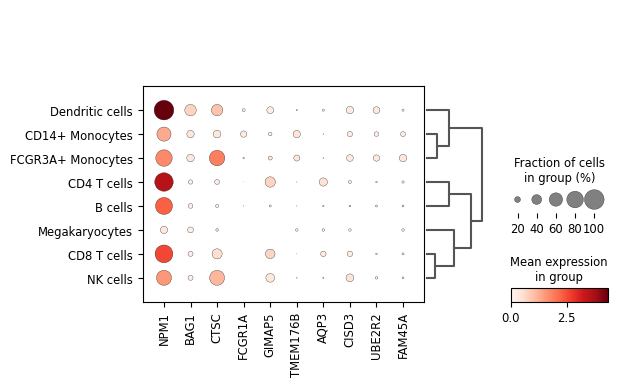

In [23]:
sc.tl.dendrogram(adata,'louvain' )
top_10 = marker_genes.sort_values(by=['p_value_adj'])["gene"].tolist()[0:10]
sc.pl.dotplot(adata, top_10, 'louvain', dendrogram=True)

In [25]:
import dash_bio

marker_genes_renamed = pydevil.rename_for_volcano(marker_genes)

volcanoplot = dash_bio.VolcanoPlot(
    dataframe=marker_genes_renamed,
    point_size=8,
    effect_size_line_width=2,
    genomewideline_width=2
)

volcanoplot